# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
from ucimlrepo import fetch_ucirepo
from sklearn.compose import make_column_selector as selector
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import lime.lime_tabular
import shap
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from DatasetAnalysis import DatasetAnalysis
from PerformanceAnalysis import PerformanceAnalysis
from Visualization import Visualization

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# Setup

In [2]:
config_file = open('config.json')
config_vars = json.load(config_file)
config_file.close()

logs_dir = config_vars["logs_dir"]

In [3]:
config_file = open('visual_config.json')
visual_vars = json.load(config_file)
config_file.close()

shap_colors_neg = visual_vars["shap_colors"]["negative"]
shap_colors_pos = visual_vars["shap_colors"]["positive"]
shap_colors = np.array([tuple(shap_colors_neg), tuple(shap_colors_pos)])

title_size = visual_vars["title_font_size"]
label_size = visual_vars["labels_font_size"]

green_color = tuple([x/255 for x in visual_vars["green_colors"]["c2"]])

# Get Dataset

In [4]:
dataset = pd.read_csv("datasets/DARWIN.csv", header=0)
X = dataset.iloc[:, :-1]
y = dataset.iloc[:, -1]

In [8]:
X

0      0.000012
1      0.000015
2      0.000010
3      0.000014
4      0.000012
         ...   
169    0.000012
170    0.000010
171    0.000012
172    0.000011
173    0.000011
Name: disp_index2, Length: 174, dtype: float64

In [6]:
y

0      P
1      P
2      P
3      P
4      P
      ..
169    H
170    H
171    H
172    H
173    H
Name: class, Length: 174, dtype: object

###### Obtain Dataset From Repository

In [7]:
# # fetch dataset 
# darwin = fetch_ucirepo(id=732)
#   
# # data (as pandas dataframes)
# X = darwin.data.features
# y = darwin.data.targets
#   
# # metadata 
# print(darwin.metadata)
# 
# # variable information
# print(darwin.variables)

In [8]:
data_analysis = DatasetAnalysis()

In [9]:
np.unique(y)

array(['H', 'P'], dtype=object)

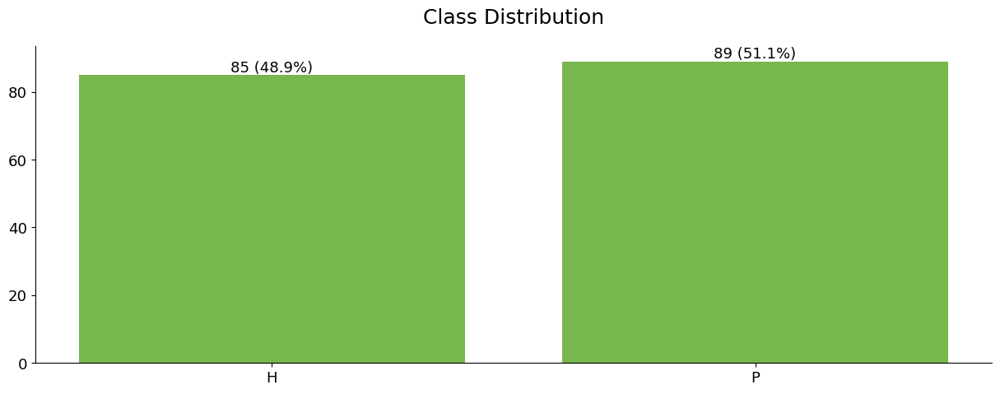

In [10]:
plt.figure(figsize=(15, 5))

data_analysis.class_dist(y, title="Class Distribution", colors=green_color, label_font_size=label_size)

plt.show()

In [11]:
numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(X)
categorical_columns = categorical_columns_selector(X)

In [12]:
from sklearn.compose import ColumnTransformer
print(f"Numerical Columns - {len(numerical_columns)}\n\n {numerical_columns}")
print(f"\n\n\nCategorical Columns - {len(categorical_columns)}\n\n {categorical_columns}")

Numerical Columns - 450

 ['air_time1', 'disp_index1', 'gmrt_in_air1', 'gmrt_on_paper1', 'max_x_extension1', 'max_y_extension1', 'mean_acc_in_air1', 'mean_acc_on_paper1', 'mean_gmrt1', 'mean_jerk_in_air1', 'mean_jerk_on_paper1', 'mean_speed_in_air1', 'mean_speed_on_paper1', 'num_of_pendown1', 'paper_time1', 'pressure_mean1', 'pressure_var1', 'total_time1', 'air_time2', 'disp_index2', 'gmrt_in_air2', 'gmrt_on_paper2', 'max_x_extension2', 'max_y_extension2', 'mean_acc_in_air2', 'mean_acc_on_paper2', 'mean_gmrt2', 'mean_jerk_in_air2', 'mean_jerk_on_paper2', 'mean_speed_in_air2', 'mean_speed_on_paper2', 'num_of_pendown2', 'paper_time2', 'pressure_mean2', 'pressure_var2', 'total_time2', 'air_time3', 'disp_index3', 'gmrt_in_air3', 'gmrt_on_paper3', 'max_x_extension3', 'max_y_extension3', 'mean_acc_in_air3', 'mean_acc_on_paper3', 'mean_gmrt3', 'mean_jerk_in_air3', 'mean_jerk_on_paper3', 'mean_speed_in_air3', 'mean_speed_on_paper3', 'num_of_pendown3', 'paper_time3', 'pressure_mean3', 'pressure

The only categorical column is 'ID' which has no relevance for classification because is just an identifier of each experiment, so it will be dropped

In [13]:
X = X.drop(columns=["ID"])
features_names = X.columns

In [14]:
#Convert from pandas to numpy and turn into a 1D array
y = y.to_numpy().ravel()
y = [0 if x == 'H' else 1 for x in y]
y

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [15]:
X_train_pd, X_test_pd, Y_train, Y_test = train_test_split(X, y, test_size=0.20, random_state=42)

X_train = X_train_pd.to_numpy()
X_test = X_test_pd.to_numpy()

## Instance to extract local explanations for all models

In [16]:
Exp_index = 3
Exp_inst = X_test[Exp_index, :]
Exp_inst_pd = X_test_pd.iloc[Exp_index, :]
Exp_inst_class = Y_test[Exp_index]
print(f"Instance:\n{Exp_inst_pd}\n\nClass: {Exp_inst_class}") #"Name" and "dtype" are not part of the instance, they must be ignored

Instance:
air_time1             1870.000000
disp_index1              0.000006
gmrt_in_air1           595.572014
gmrt_on_paper1         498.890817
max_x_extension1      2316.000000
                        ...      
num_of_pendown25       124.000000
paper_time25         38330.000000
pressure_mean25       1739.271067
pressure_var25      264041.371600
total_time25         77215.000000
Name: 127, Length: 450, dtype: float64

Class: 0


# Classification

In [17]:
perf_analysis = PerformanceAnalysis()

## <i>Logistic Regression</i> (LR)

In [18]:
lr_clf = LogisticRegression(max_iter=2000).fit(X_train, Y_train)

Metrics,Values
accuracy,0.879310
false-positive rate,0.034483
false-negative rate,0.206897
precision,0.958333
recall,0.793103
f-score,0.867925


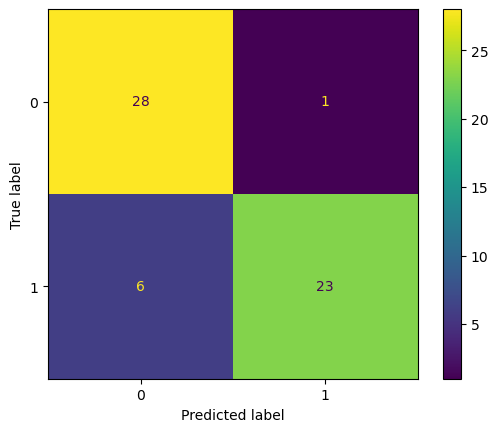

In [19]:
lr_ye = lr_clf.predict(X_test)

lr_cm = confusion_matrix(Y_test, lr_ye)
lr_metrics = perf_analysis.compute_metrics(lr_cm)
display(lr_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, lr_ye)

lr_y2d = lr_clf.predict_proba(X_test)[:, 1]

plt.show()

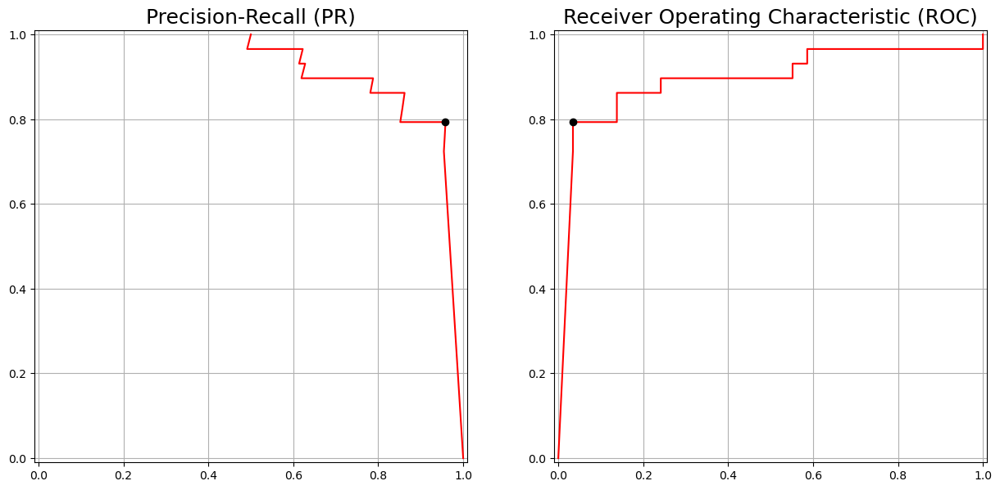

In [20]:
plt.figure(figsize=(15, 10))

plt.subplot(1,2,1)
perf_analysis.plot_PR(Y_test, lr_cm, lr_y2d)

plt.subplot(1,2,2)
perf_analysis.plot_ROC(Y_test, lr_cm, lr_y2d)

plt.show()

### Extract Explanations

#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [21]:
lr_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
lr_LIME_explanation = lr_LIME_explainer.explain_instance(Exp_inst, lr_clf.predict_proba)

In [22]:
lr_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [23]:
shap.initjs()

In [24]:
lr_SHAP_exp = shap.KernelExplainer(lr_clf.predict_proba, shap.sample(X_train_pd, 100))
lr_shap_loc_values = np.array(lr_SHAP_exp.shap_values(Exp_inst_pd))

In [25]:
shap.force_plot(lr_SHAP_exp.expected_value[1], lr_shap_loc_values[1, :], Exp_inst_pd)

#### Global (SHAP)

In [26]:
lr_shap_global_values = lr_SHAP_exp.shap_values(X_test_pd)

  0%|          | 0/58 [00:00<?, ?it/s]

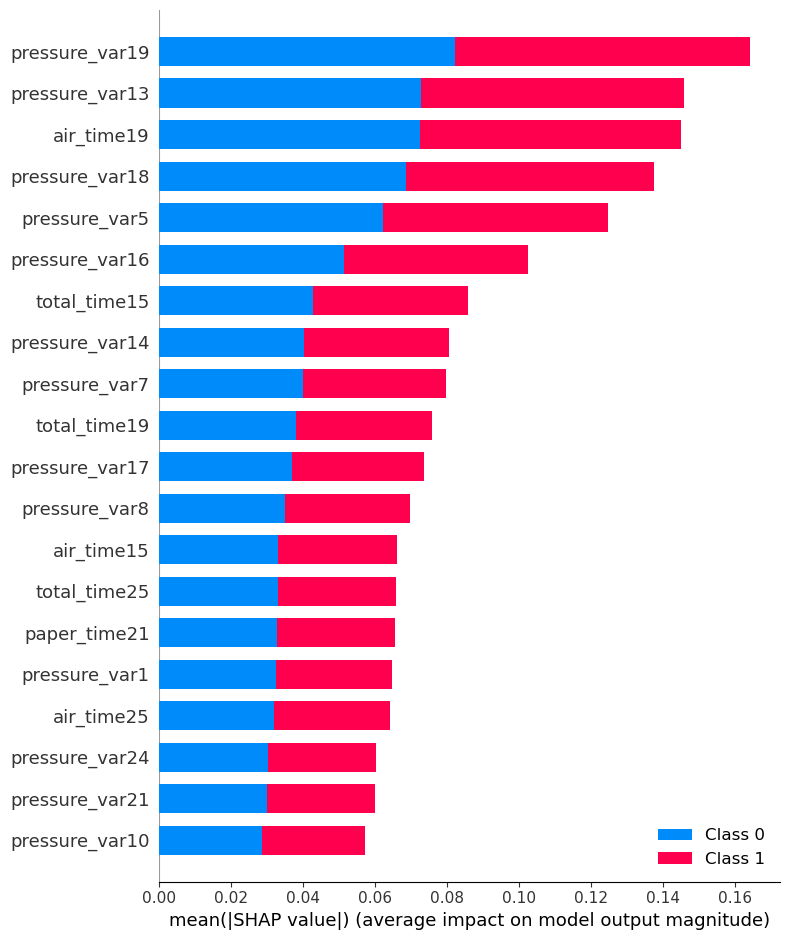

In [27]:
shap.summary_plot(lr_shap_global_values, X_test_pd, plot_type="bar")

## <i>Random Forest</i> (RF)

In [28]:
rf_clf = RandomForestClassifier().fit(X_train, Y_train)

Metrics,Values
accuracy,0.862069
false-positive rate,0.206897
false-negative rate,0.068966
precision,0.818182
recall,0.931034
f-score,0.870968


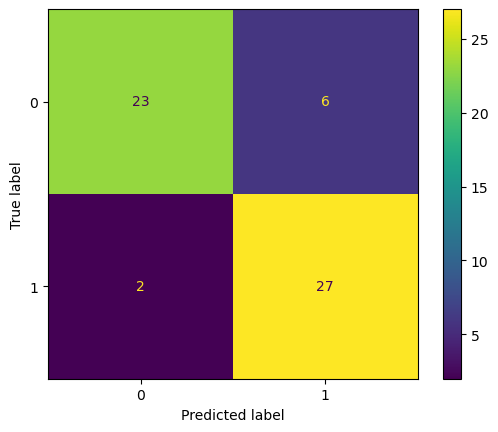

In [29]:
rf_ye = rf_clf.predict(X_test)

rf_cm = confusion_matrix(Y_test, rf_ye)
rf_metrics = perf_analysis.compute_metrics(rf_cm)
display(rf_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, rf_ye)

rf_y2d = rf_clf.predict_proba(X_test)[:, 1]

plt.show()

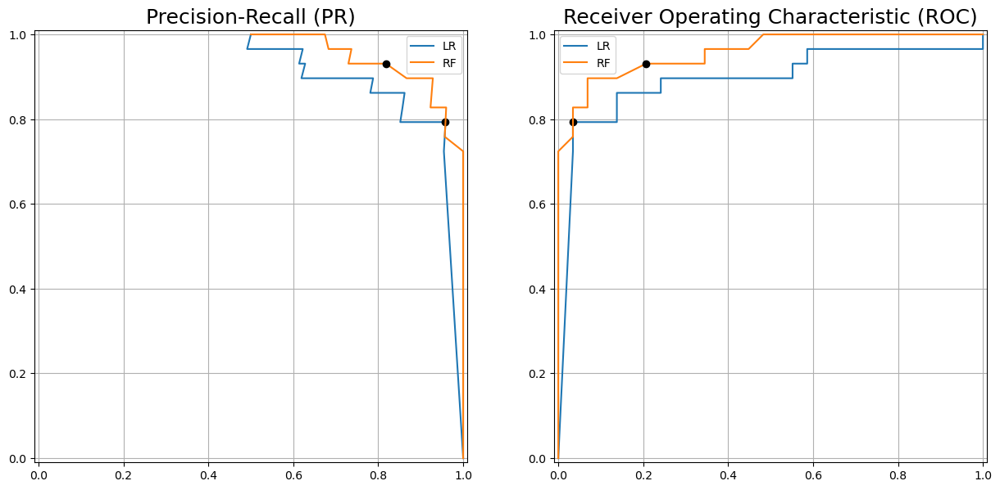

In [30]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test], [lr_cm, rf_cm], [lr_y2d, rf_y2d], ["LR", "RF"])

plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test], [lr_cm, rf_cm], [lr_y2d, rf_y2d], ["LR","RF"])


plt.show()

### Extract Explanations 

#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [31]:
rf_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
rf_LIME_explanation = rf_LIME_explainer.explain_instance(Exp_inst, rf_clf.predict_proba)

In [32]:
rf_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [33]:
rf_SHAP_exp = shap.Explainer(rf_clf)
rf_shap_loc_values = np.array(rf_SHAP_exp.shap_values(Exp_inst_pd))

In [34]:
shap.force_plot(rf_SHAP_exp.expected_value[1], rf_shap_loc_values[1, :], Exp_inst_pd)

#### Global (SHAP)

In [35]:
rf_shap_global_values = rf_SHAP_exp.shap_values(X_test_pd)

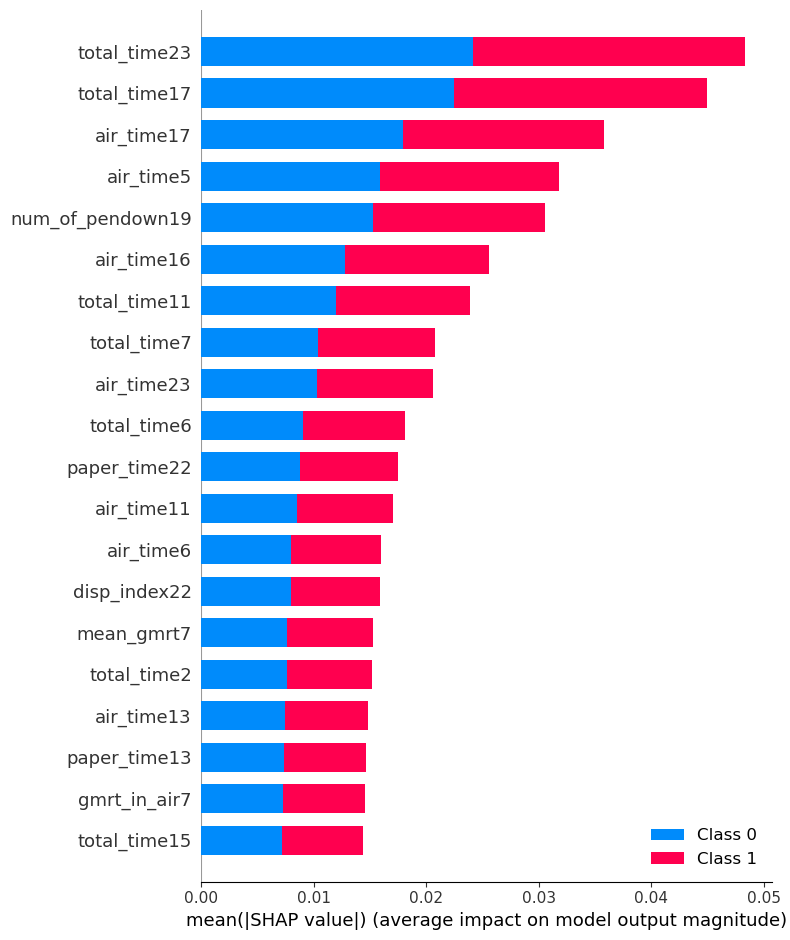

In [36]:
shap.summary_plot(rf_shap_global_values, X_test_pd, plot_type="bar")

## <i> Support Vector Machines</i> (SVM)

In [37]:
svm_clf = SVC(kernel="linear", probability=True).fit(X_train, Y_train)

Metrics,Values
accuracy,0.896552
false-positive rate,0.034483
false-negative rate,0.172414
precision,0.960000
recall,0.827586
f-score,0.888889


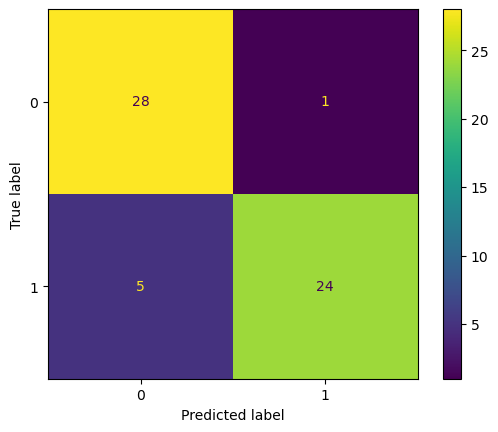

In [38]:
svm_ye = svm_clf.predict(X_test)

svm_cm = confusion_matrix(Y_test, svm_ye)
svm_metrics = perf_analysis.compute_metrics(svm_cm)
display(svm_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, svm_ye)

svm_y2d = svm_clf.decision_function(X_test)

plt.show()

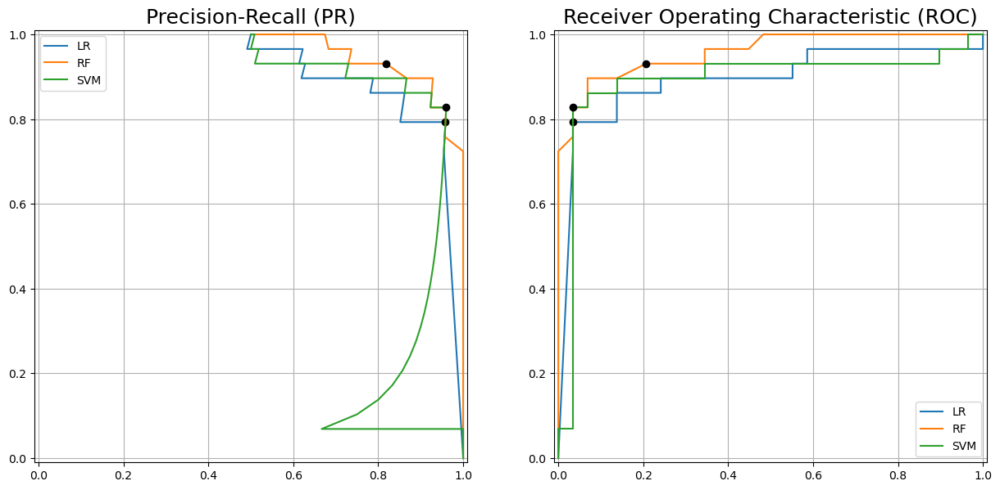

In [39]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm], [lr_y2d, rf_y2d, svm_y2d], ["LR", "RF", "SVM"])
plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm], [lr_y2d, rf_y2d, svm_y2d], ["LR","RF", "SVM"])

plt.show()

### Extract Explanations

#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [40]:
svm_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
svm_LIME_explanation = svm_LIME_explainer.explain_instance(Exp_inst, svm_clf.predict_proba)

In [41]:
svm_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [42]:
svm_SHAP_exp = shap.KernelExplainer(svm_clf.predict_proba, shap.sample(X_train_pd, 20))
svm_shap_loc_values = np.array(svm_SHAP_exp.shap_values(Exp_inst_pd))

In [43]:
shap.force_plot(svm_SHAP_exp.expected_value[1], svm_shap_loc_values[1, :], Exp_inst_pd)

#### Global (SHAP)

In [44]:
svm_shap_global_values = svm_SHAP_exp.shap_values(X_test_pd)

  0%|          | 0/58 [00:00<?, ?it/s]

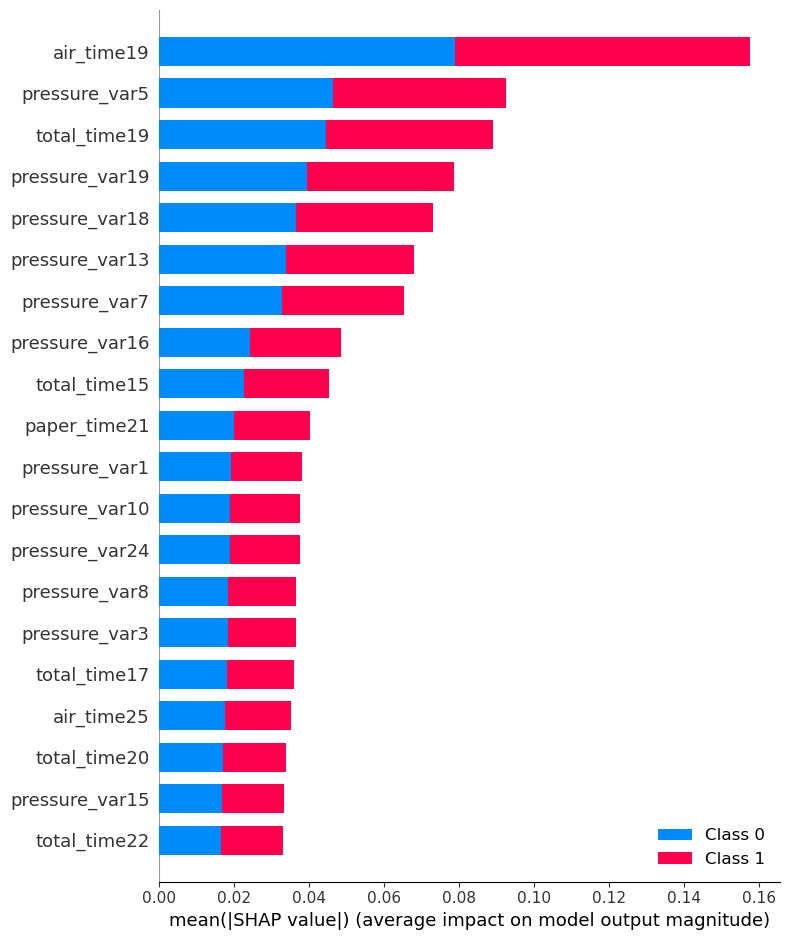

In [45]:
shap.summary_plot(svm_shap_global_values, X_test_pd, plot_type="bar")

## <i>Explainable Boosting Machine</i> (EBM)

In [46]:
ebm_clf = ExplainableBoostingClassifier(max_bins=2048, smoothing_rounds=500)
ebm_clf.fit(X_train_pd, Y_train)

ExplainableBoostingClassifier(max_bins=2048, smoothing_rounds=500)

Metrics,Values
accuracy,0.879310
false-positive rate,0.103448
false-negative rate,0.137931
precision,0.892857
recall,0.862069
f-score,0.877193


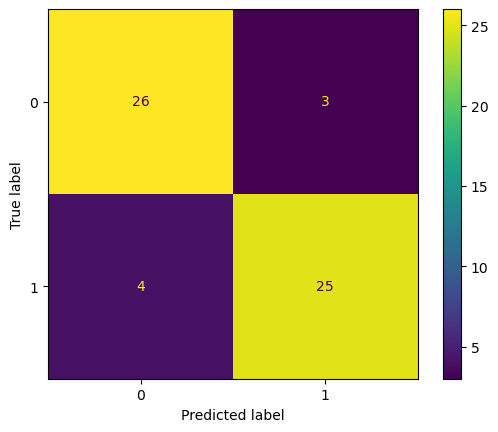

In [47]:
ebm_ye = ebm_clf.predict(X_test_pd)

ebm_cm = confusion_matrix(Y_test, ebm_ye)
ebm_metrics = perf_analysis.compute_metrics(ebm_cm)
display(ebm_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, ebm_ye)

ebm_y2d = ebm_clf.decision_function(X_test)

plt.show()

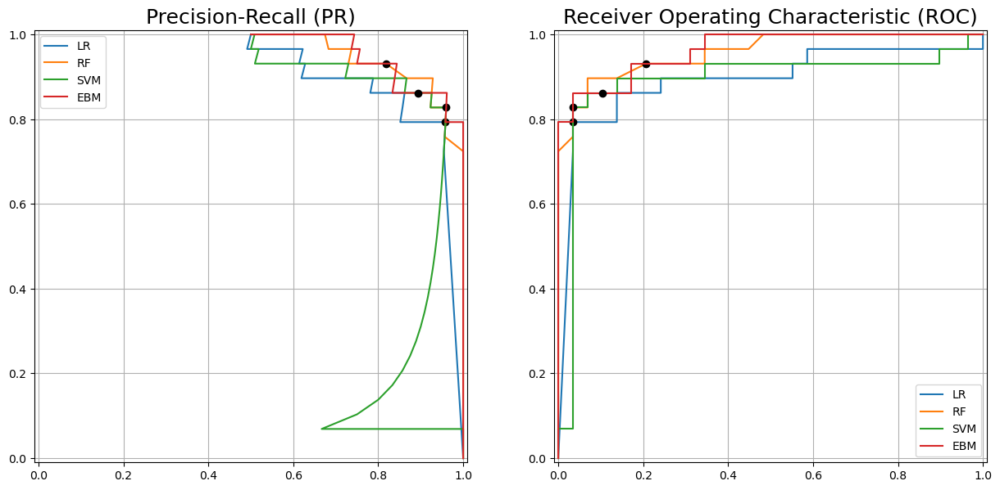

In [48]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR", "RF", "SVM", "EBM"])
plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR","RF", "SVM", "EBM"])

plt.show()

### Extract Explanations

#### Local

In [49]:
ebm_local = ebm_clf.explain_local(X_test, Y_test)
show(ebm_local)

<!-- http://127.0.0.1:7467/2214020294864/ -->

#### Global

In [50]:
ebm_global = ebm_clf.explain_global()
show(ebm_global)

<!-- http://127.0.0.1:7467/2213670828496/ -->

# Summary

In [51]:
visual = Visualization()

## Metrics

In [52]:
lr_metrics = lr_metrics.rename(columns={"Values": "LR"})
lr_metrics["LR"] = [round(x, 2) for x in lr_metrics["LR"]]
rf_metrics = rf_metrics.rename(columns={"Values": "RF"})
rf_metrics["RF"] = [round(x, 2) for x in rf_metrics["RF"]]
svm_metrics = svm_metrics.rename(columns={"Values": "SVM"})
svm_metrics["SVM"] = [round(x, 2) for x in svm_metrics["SVM"]]
ebm_metrics = ebm_metrics.rename(columns={"Values": "EBM"})
ebm_metrics["EBM"] = [round(x, 2) for x in ebm_metrics["EBM"]]

overall_metrics = pd.concat([lr_metrics, rf_metrics, svm_metrics, ebm_metrics], axis=1)
display(overall_metrics)

Metrics,LR,RF,SVM,EBM
accuracy,0.88,0.86,0.90,0.88
false-positive rate,0.03,0.21,0.03,0.10
false-negative rate,0.21,0.07,0.17,0.14
precision,0.96,0.82,0.96,0.89
recall,0.79,0.93,0.83,0.86
f-score,0.87,0.87,0.89,0.88


In [53]:
latex_str = overall_metrics.columns.name  + ''.join([" & " + x for x in overall_metrics.columns]) + " \\\ \n"

In [54]:
for i, row in overall_metrics.iterrows():
    
    aux_str = ""
    for k in row:
        aux_str += f" & {k}"
    
    latex_str += aux_str[3:] + " \\\ \n"

with open(f"{logs_dir}/darwin_metrics.txt", "w") as text_file:
    print(latex_str, file=text_file)

## Confusion Matrices

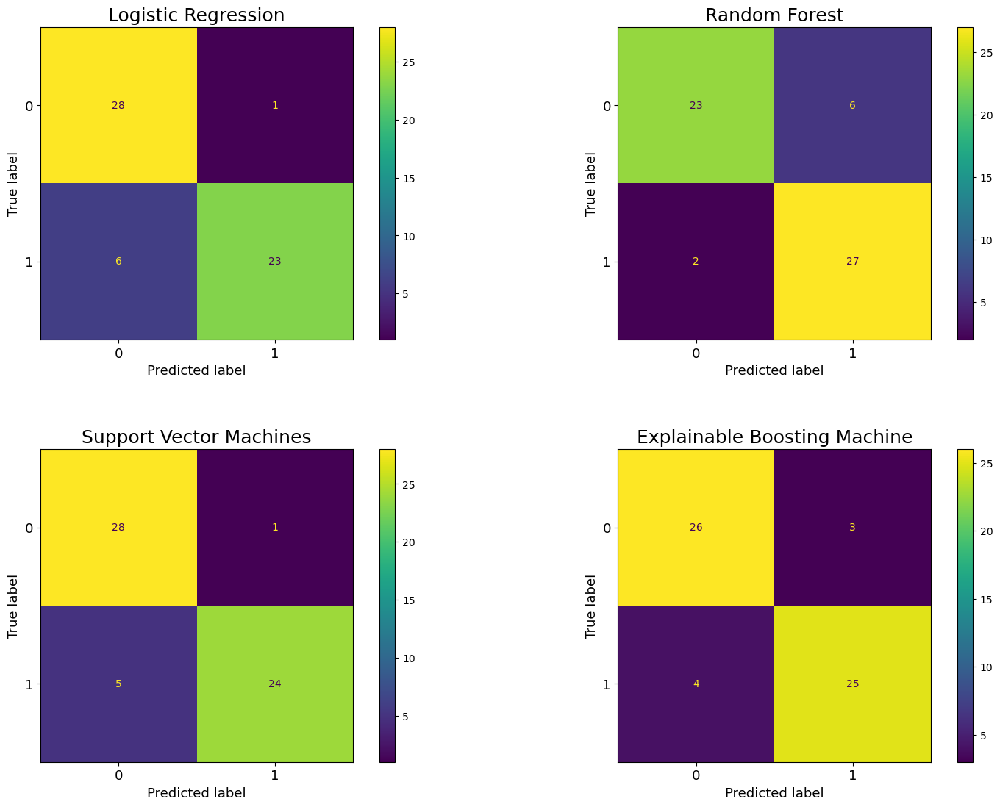

In [55]:
visual.confusion_matrices([Y_test, Y_test, Y_test, Y_test], 
                          [lr_ye, rf_ye, svm_ye, ebm_ye],
                          nrows=2, 
                          ncols=2, 
                          figsize=(15,10),
                          title_size=title_size,
                          label_size=label_size,
                          titles=["Logistic Regression", "Random Forest", "Support Vector Machines", "Explainable Boosting Machine"]
                          )

plt.show()

## Curves

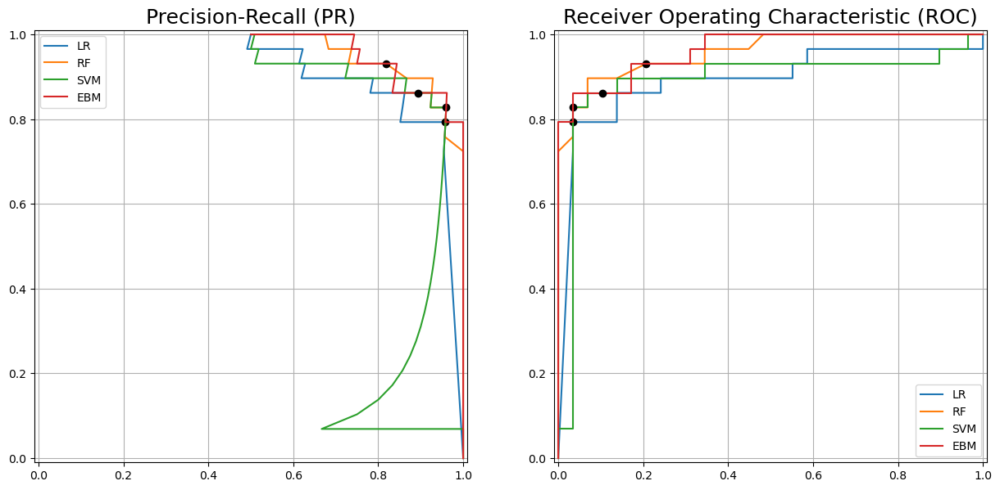

In [56]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR", "RF", "SVM", "EBM"])
plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR","RF", "SVM", "EBM"])

plt.savefig(f"{logs_dir}/darwin_PR_ROC.png")
plt.show()

## Local Explanations

### LIME

In [57]:
lr_LIME_explanation.show_in_notebook(show_table=True)

In [58]:
rf_LIME_explanation.show_in_notebook(show_table=True)

In [59]:
svm_LIME_explanation.show_in_notebook(show_table=True)

### SHAP & EBM

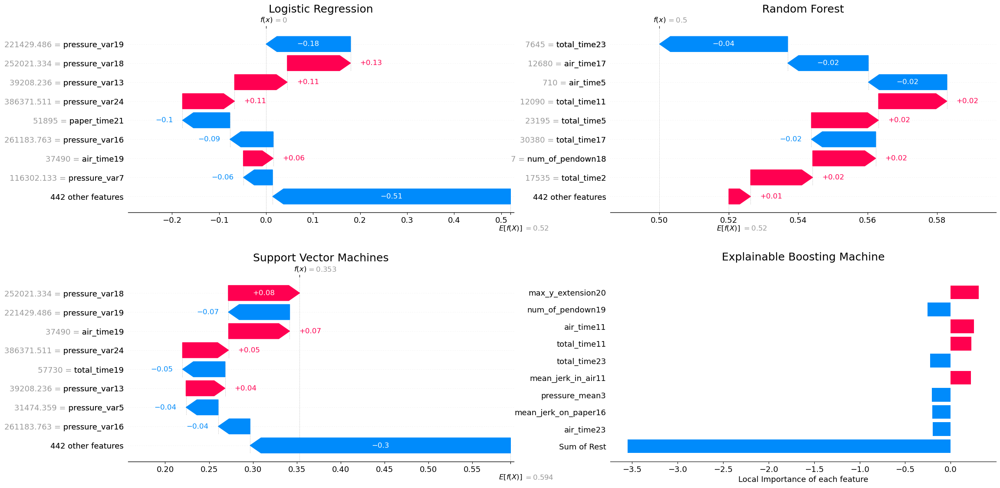

In [60]:
explanations = [shap.Explanation(lr_shap_loc_values[1, :], lr_SHAP_exp.expected_value[1], data=Exp_inst_pd),
                shap.Explanation(rf_shap_loc_values[1, :], rf_SHAP_exp.expected_value[1], data=Exp_inst_pd),
                shap.Explanation(svm_shap_loc_values[1, :], svm_SHAP_exp.expected_value[1], data=Exp_inst_pd)]


visual.local_shap(explanations, 
                  ebm_local.data(key=Exp_index),
                  nrows = 2,
                  ncols = 2,
                  figsize = (20,10),
                  title_size = title_size,
                  label_size = label_size,
                  titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                  ebm_colors = shap_colors/255,
                  num_features=9)

plt.savefig(f"{logs_dir}/darwin_local_SHAP_EBM.png", bbox_inches="tight")

plt.show()


## Global Explanations

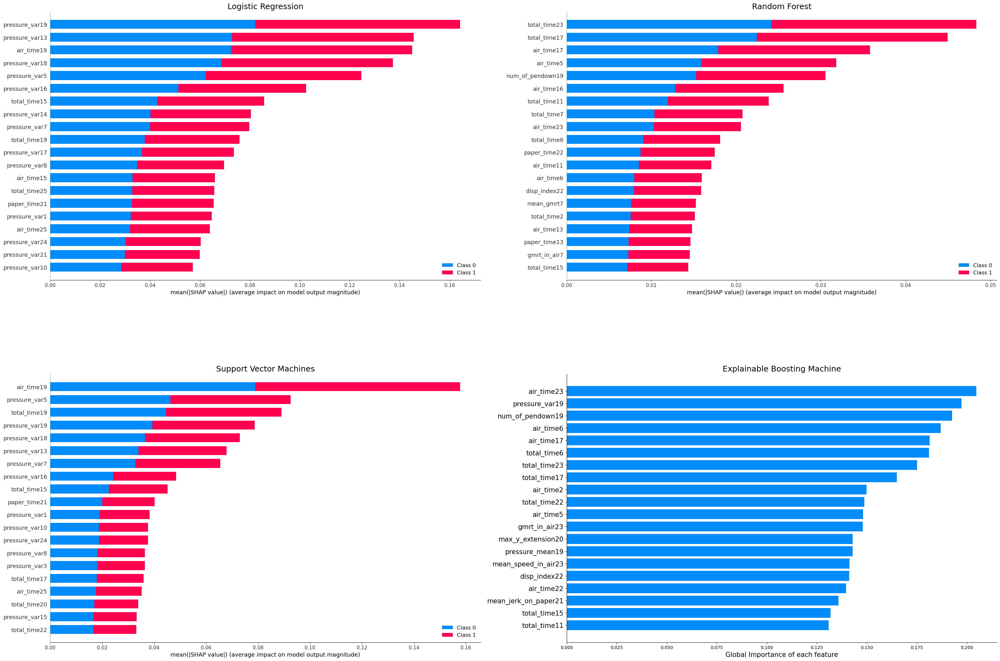

In [61]:
global_shap_values = [lr_shap_global_values,
                      rf_shap_global_values,
                      svm_shap_global_values]

visual.global_shap(global_shap_values,
                   X_test_pd,
                   ebm_global.data(),
                   nrows = 2,
                   ncols = 2,
                   figsize = (30,20),
                   title_size = title_size,
                   label_size = 15,
                   titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                   ebm_colors = shap_colors/255,
                   num_features=20)

plt.savefig(f"{logs_dir}/darwin_global_SHAP_EBM.png", bbox_inches="tight")

plt.show()